In [74]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error, structural_similarity
import matplotlib.pyplot as plt

def calculate_metrics(image1_path, image2_path):
    image1 = cv2.imread(f"/data/notebook_files/{image1_path}")
    image2 = cv2.imread(f"/data/notebook_files/{image2_path}")
    mse = mean_squared_error(image1, image2)
    psnr = peak_signal_noise_ratio(image1, image2, data_range=255)
    return f"MSE: {mse:.10f}\nPSNR: {psnr:.10f}"

def show_images(image_path: list, title_list: list, subtitle: list, plot_title: str, title_padding=0.0, stats_padding=0.0):
    fig = plt.figure(figsize=(15, 4),constrained_layout=True)

    aspect_ratio = 0.0
    y0_min = 0
    y1_max = 0
    columns = 5
    rows = 1
    skip_first_subtitle = False
    for imageIndex in range(len(image_path)):
        img_raw = cv2.imread(f"/data/notebook_files/{image_path[imageIndex]}")
        img = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
        ax = fig.add_subplot(rows, columns, imageIndex+1)
        height, width, channels = img.shape
        aspect_ratio = width / height
        
        ax.title.set_text(title_list[imageIndex])
        axes_position = ax.get_position()
        # print(axes_position)
        if len(image_path) == len(subtitle) and imageIndex == 0:
            skip_first_subtitle = True
            plt.imshow(img)
            y1_max = axes_position.y1
            y0_min = axes_position.y0
            continue
        if imageIndex != 0:
            reducer = 0.0
            if 0.9 < aspect_ratio < 1.1:
                reducer = 0.16
            # Landscape
            elif aspect_ratio > 1.0:
                reducer = 0.4
            # Potrait
            elif aspect_ratio < 1.0:
                reducer = 0.05

            if aspect_ratio == 1.25:
                stats_padding = -0.175
                title_padding = 0.015
            fig.text(0.5,-y0_min-reducer-stats_padding, subtitle[skip_first_subtitle if imageIndex else imageIndex-1], size=12, ha="center", 
         transform=ax.transAxes)
            # print(aspect_ratio)
            # print(f"reducer = {reducer}")
            # print(-y0_min-reducer)
        plt.imshow(img)
        y1_max = axes_position.y1
        y0_min = axes_position.y0

    base_add = 0.0
    if 0.9 < aspect_ratio < 1.1:
        base_add = 0.07
    elif aspect_ratio > 1.0:
        base_add = -0.025
    elif aspect_ratio < 1.0:
        base_add = 0.25

    fig.text(0.5,y1_max+base_add+title_padding, plot_title, horizontalalignment='center',fontsize=20)

    fig.text(0.5,y1_max+base_add+title_padding+0.1, "     ")
    
    # fig.suptitle('suptitle')
    # fig.tight_layout()
    plt.show()

In [75]:
from os import walk

original_f = []
mod50_f = []
mod300_f = []
mod600_f = []
mod1200_f = []
for (dirPath, dirnames, filenames) in walk("original/"):
    original_f.extend(filenames)
    break

for i in range(len(original_f)):
    mod50_f.append(f"modified_50/{original_f[i].split('.')[0]}.jpg")
    mod300_f.append(f"modified_300/{original_f[i].split('.')[0]}.jpg")
    mod600_f.append(f"modified_600/{original_f[i].split('.')[0]}.jpg")
    mod1200_f.append(f"modified_1200/{original_f[i].split('.')[0]}.jpg")
    original_f[i] = f"original/{original_f[i]}"
    print(mod50_f[i])

modified_50/Vestmannaeyjar, Iceland.jpg
modified_50/Village of Campo de Caso.jpg
modified_50/cannon.jpg
modified_50/Patagonia National Park.jpg
modified_50/basketball.jpg
modified_50/cablecar.jpg
modified_50/Golden Valley, United States.jpg
modified_50/mountain_bike.jpg
modified_50/bagel.jpg
modified_50/Rainier.jpg
modified_50/table.jpg
modified_50/goldhill.jpg
modified_50/Mercury.jpg
modified_50/Sedona, United States.jpg
modified_50/Moena, Italy.jpg
modified_50/Earth.jpg
modified_50/car.jpg
modified_50/macaw.jpg
modified_50/yacht.jpg
modified_50/drum.jpg
modified_50/bookshop.jpg
modified_50/Stair of the Turks, Turkey.jpg
modified_50/Malamute.jpg
modified_50/daisy.jpg
modified_50/pens.jpg
modified_50/fruits.jpg
modified_50/girl.jpg
modified_50/airship.jpg
modified_50/airplane.jpg
modified_50/Muriwai Beach, New Zealand.jpg
modified_50/chicken.jpg
modified_50/unmul.jpg
modified_50/Laufskalavarda, Iceland.jpg
modified_50/Carrena, Spain.jpg
modified_50/monarch.jpg
modified_50/soccer.jpg
mo

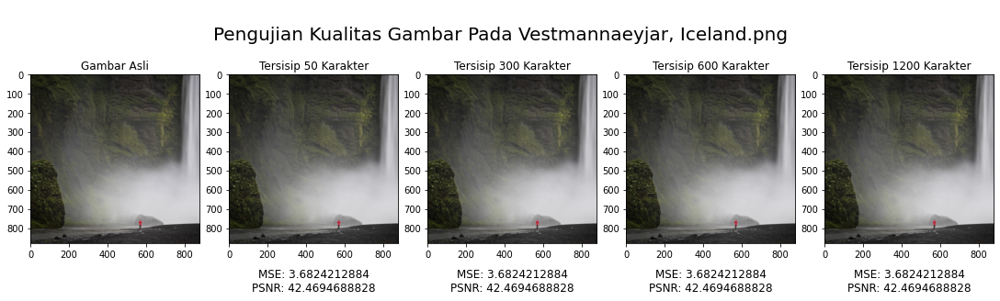

In [76]:
filename = original_f[0].lstrip("original/")
metrics_50 = calculate_metrics(original_f[0], mod50_f[0])
metrics_300 = calculate_metrics(original_f[0], mod300_f[0])
metrics_600 = calculate_metrics(original_f[0], mod600_f[0])
metrics_1200 = calculate_metrics(original_f[0], mod1200_f[0])
show_images(image_path=[original_f[0], mod50_f[0], mod300_f[0], mod600_f[0], mod1200_f[0]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

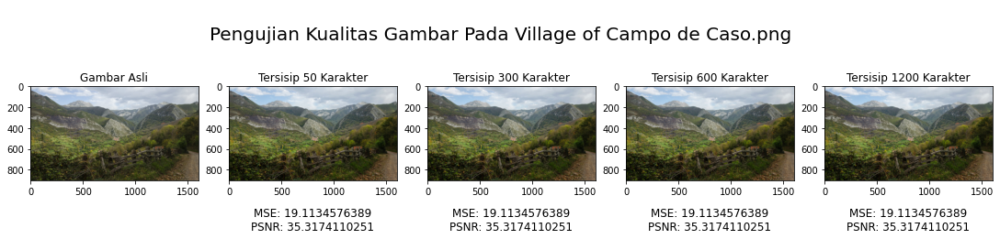

In [77]:
filename = original_f[1].lstrip("original/")
metrics_50 = calculate_metrics(original_f[1], mod50_f[1])
metrics_300 = calculate_metrics(original_f[1], mod300_f[1])
metrics_600 = calculate_metrics(original_f[1], mod600_f[1])
metrics_1200 = calculate_metrics(original_f[1], mod1200_f[1])
show_images(image_path=[original_f[1], mod50_f[1], mod300_f[1], mod600_f[1], mod1200_f[1]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

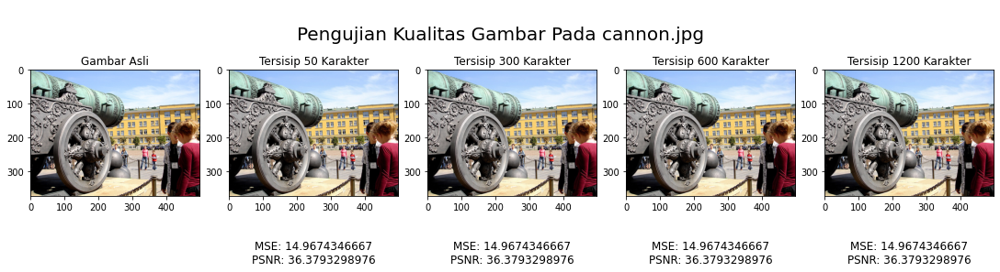

In [78]:
filename = original_f[2].lstrip("original/")
metrics_50 = calculate_metrics(original_f[2], mod50_f[2])
metrics_300 = calculate_metrics(original_f[2], mod300_f[2])
metrics_600 = calculate_metrics(original_f[2], mod600_f[2])
metrics_1200 = calculate_metrics(original_f[2], mod1200_f[2])
show_images(image_path=[original_f[2], mod50_f[2], mod300_f[2], mod600_f[2], mod1200_f[2]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

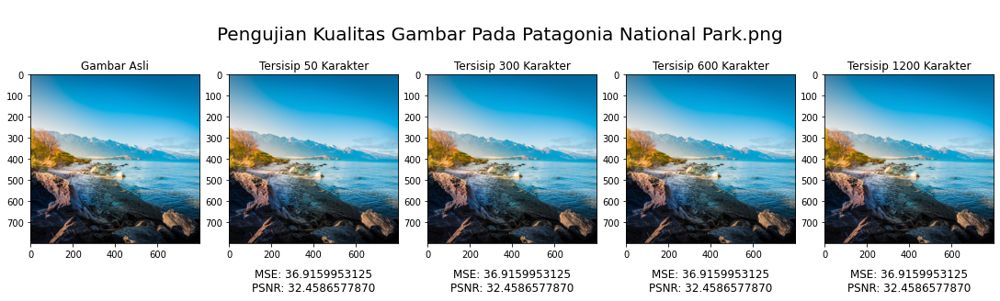

In [79]:
filename = original_f[3].lstrip("original/")
metrics_50 = calculate_metrics(original_f[3], mod50_f[3])
metrics_300 = calculate_metrics(original_f[3], mod300_f[3])
metrics_600 = calculate_metrics(original_f[3], mod600_f[3])
metrics_1200 = calculate_metrics(original_f[3], mod1200_f[3])
show_images(image_path=[original_f[3], mod50_f[3], mod300_f[3], mod600_f[3], mod1200_f[3]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

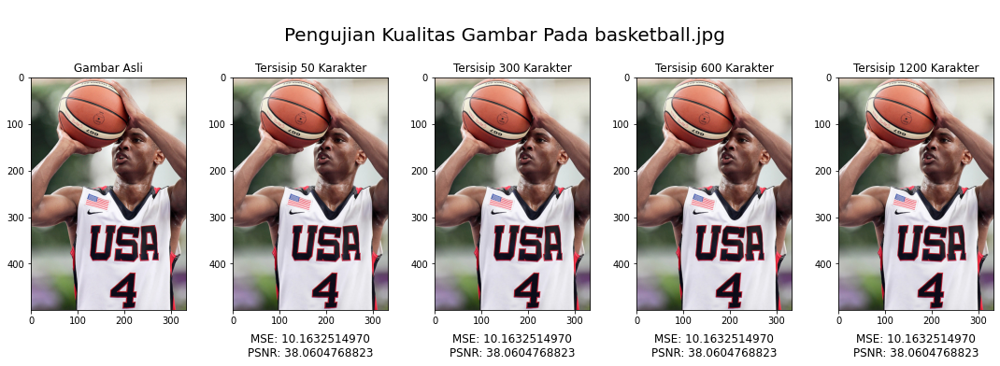

In [80]:
filename = original_f[4].lstrip("original/")
metrics_50 = calculate_metrics(original_f[4], mod50_f[4])
metrics_300 = calculate_metrics(original_f[4], mod300_f[4])
metrics_600 = calculate_metrics(original_f[4], mod600_f[4])
metrics_1200 = calculate_metrics(original_f[4], mod1200_f[4])
show_images(
    image_path=[original_f[4], mod50_f[4], mod300_f[4], mod600_f[4], mod1200_f[4]], 
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], 
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
    title_padding=-0.06,
    stats_padding=0.025
)

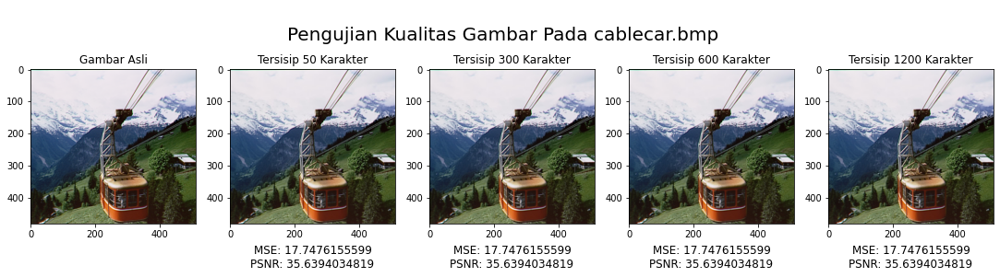

In [81]:
filename = original_f[5].lstrip("original/")
metrics_50 = calculate_metrics(original_f[5], mod50_f[5])
metrics_300 = calculate_metrics(original_f[5], mod300_f[5])
metrics_600 = calculate_metrics(original_f[5], mod600_f[5])
metrics_1200 = calculate_metrics(original_f[5], mod1200_f[5])
show_images(
    image_path=[original_f[5], mod50_f[5], mod300_f[5], mod600_f[5], mod1200_f[5]], 
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], 
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
    title_padding=-0.05
)

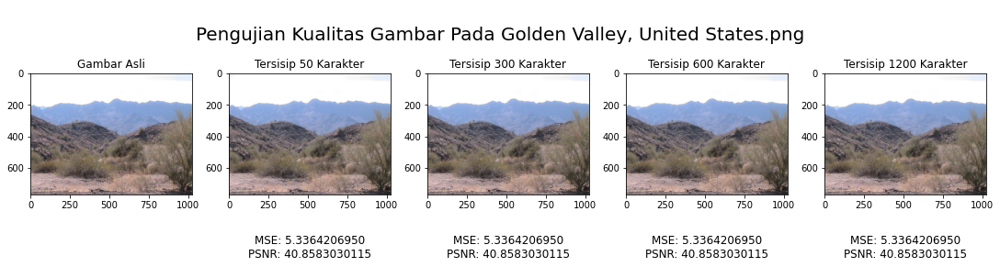

In [82]:
filename = original_f[6].lstrip("original/")
metrics_50 = calculate_metrics(original_f[6], mod50_f[6])
metrics_300 = calculate_metrics(original_f[6], mod300_f[6])
metrics_600 = calculate_metrics(original_f[6], mod600_f[6])
metrics_1200 = calculate_metrics(original_f[6], mod1200_f[6])
show_images(image_path=[original_f[6], mod50_f[6], mod300_f[6], mod600_f[6], mod1200_f[6]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

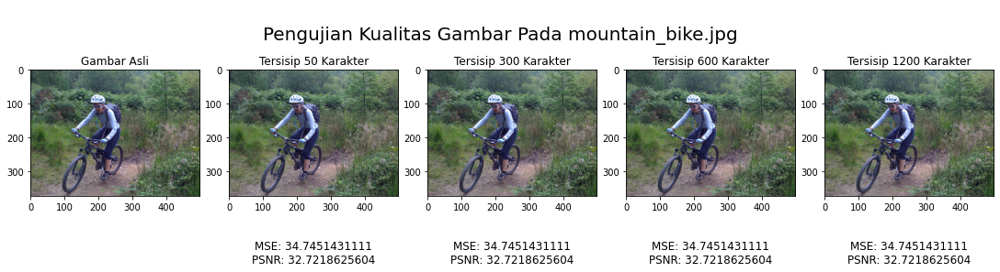

In [83]:
filename = original_f[7].lstrip("original/")
metrics_50 = calculate_metrics(original_f[7], mod50_f[7])
metrics_300 = calculate_metrics(original_f[7], mod300_f[7])
metrics_600 = calculate_metrics(original_f[7], mod600_f[7])
metrics_1200 = calculate_metrics(original_f[7], mod1200_f[7])
show_images(image_path=[original_f[7], mod50_f[7], mod300_f[7], mod600_f[7], mod1200_f[7]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

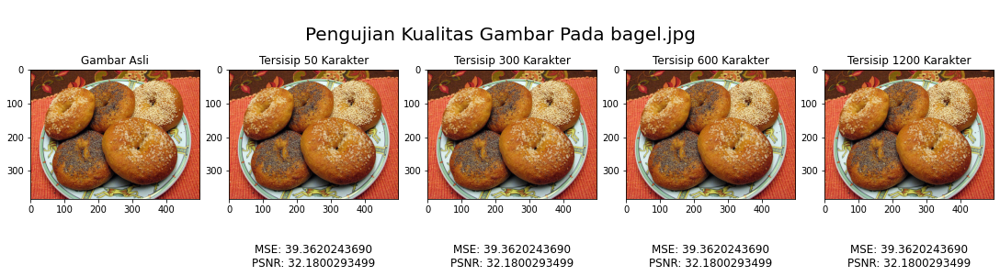

In [84]:
filename = original_f[8].lstrip("original/")
metrics_50 = calculate_metrics(original_f[8], mod50_f[8])
metrics_300 = calculate_metrics(original_f[8], mod300_f[8])
metrics_600 = calculate_metrics(original_f[8], mod600_f[8])
metrics_1200 = calculate_metrics(original_f[8], mod1200_f[8])
show_images(image_path=[original_f[8], mod50_f[8], mod300_f[8], mod600_f[8], mod1200_f[8]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

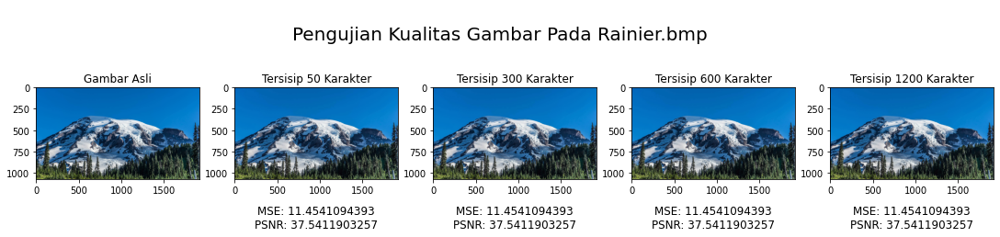

In [85]:
filename = original_f[9].lstrip("original/")
metrics_50 = calculate_metrics(original_f[9], mod50_f[9])
metrics_300 = calculate_metrics(original_f[9], mod300_f[9])
metrics_600 = calculate_metrics(original_f[9], mod600_f[9])
metrics_1200 = calculate_metrics(original_f[9], mod1200_f[9])
show_images(image_path=[original_f[9], mod50_f[9], mod300_f[9], mod600_f[9], mod1200_f[9]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

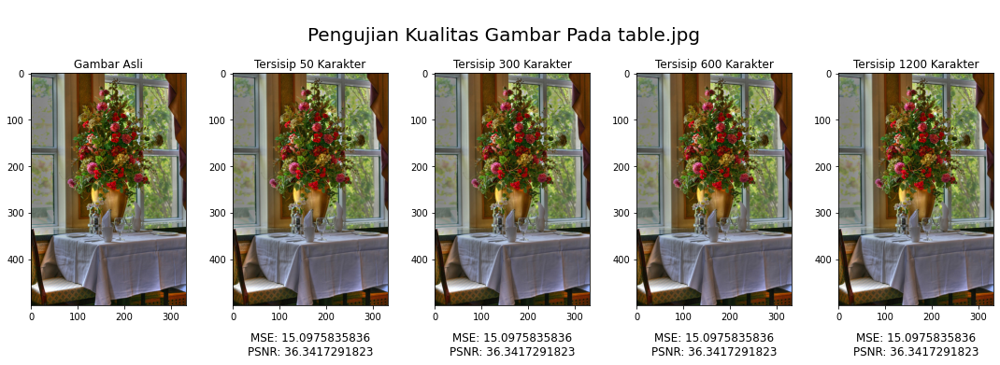

In [86]:
filename = original_f[10].lstrip("original/")
metrics_50 = calculate_metrics(original_f[10], mod50_f[10])
metrics_300 = calculate_metrics(original_f[10], mod300_f[10])
metrics_600 = calculate_metrics(original_f[10], mod600_f[10])
metrics_1200 = calculate_metrics(original_f[10], mod1200_f[10])
show_images(
    image_path=[original_f[10], mod50_f[10], mod300_f[10], mod600_f[10], mod1200_f[10]], 
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], 
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
    title_padding=-0.075,
    stats_padding=0.04
)

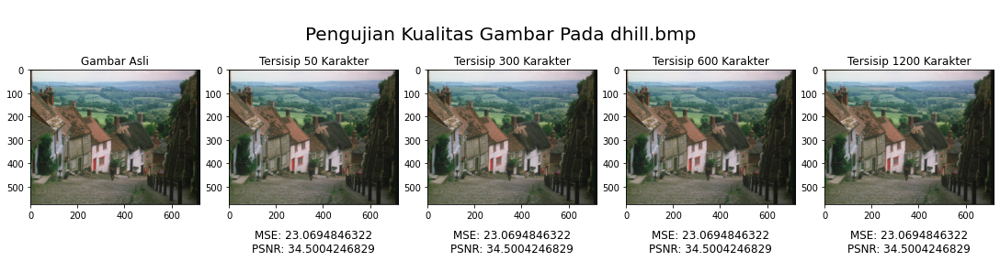

In [87]:
filename = original_f[11].lstrip("original/")
metrics_50 = calculate_metrics(original_f[11], mod50_f[11])
metrics_300 = calculate_metrics(original_f[11], mod300_f[11])
metrics_600 = calculate_metrics(original_f[11], mod600_f[11])
metrics_1200 = calculate_metrics(original_f[11], mod1200_f[11])
show_images(image_path=[original_f[11], mod50_f[11], mod300_f[11], mod600_f[11], mod1200_f[11]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

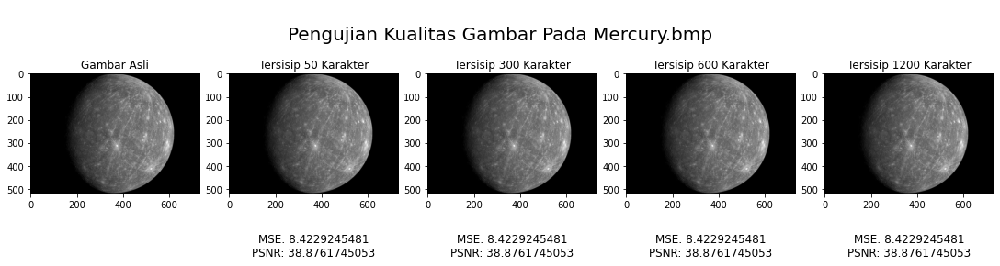

In [88]:
filename = original_f[12].lstrip("original/")
metrics_50 = calculate_metrics(original_f[12], mod50_f[12])
metrics_300 = calculate_metrics(original_f[12], mod300_f[12])
metrics_600 = calculate_metrics(original_f[12], mod600_f[12])
metrics_1200 = calculate_metrics(original_f[12], mod1200_f[12])
show_images(image_path=[original_f[12], mod50_f[12], mod300_f[12], mod600_f[12], mod1200_f[12]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

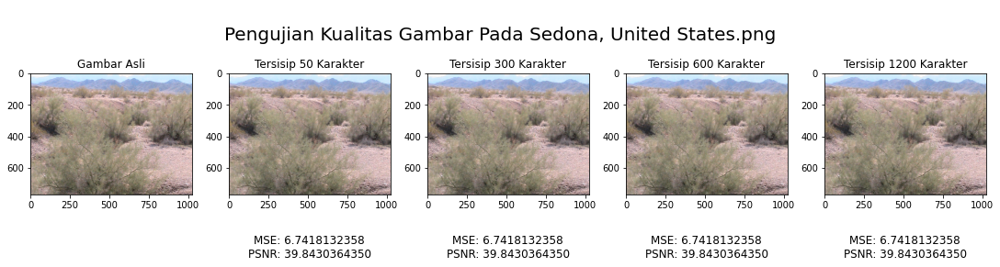

In [89]:
filename = original_f[13].lstrip("original/")
metrics_50 = calculate_metrics(original_f[13], mod50_f[13])
metrics_300 = calculate_metrics(original_f[13], mod300_f[13])
metrics_600 = calculate_metrics(original_f[13], mod600_f[13])
metrics_1200 = calculate_metrics(original_f[13], mod1200_f[13])
show_images(image_path=[original_f[13], mod50_f[13], mod300_f[13], mod600_f[13], mod1200_f[13]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

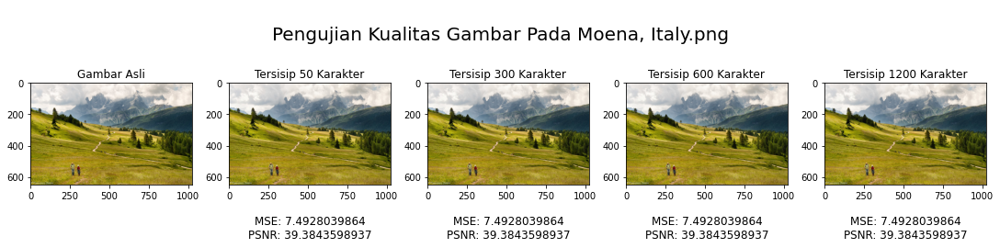

In [90]:
filename = original_f[14].lstrip("original/")
metrics_50 = calculate_metrics(original_f[14], mod50_f[14])
metrics_300 = calculate_metrics(original_f[14], mod300_f[14])
metrics_600 = calculate_metrics(original_f[14], mod600_f[14])
metrics_1200 = calculate_metrics(original_f[14], mod1200_f[14])
show_images(image_path=[original_f[14], mod50_f[14], mod300_f[14], mod600_f[14], mod1200_f[14]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

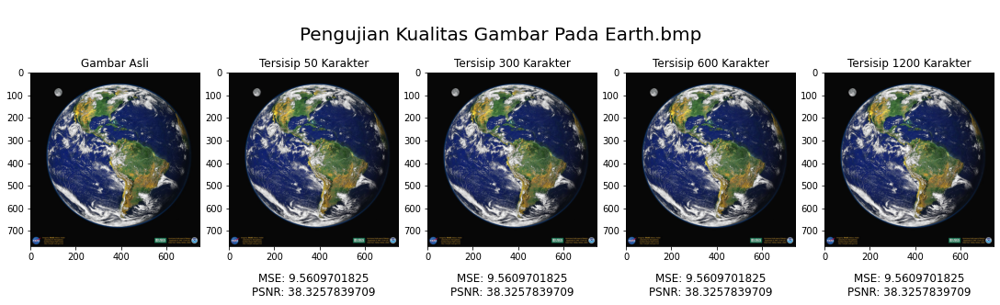

In [91]:
filename = original_f[15].lstrip("original/")
metrics_50 = calculate_metrics(original_f[15], mod50_f[15])
metrics_300 = calculate_metrics(original_f[15], mod300_f[15])
metrics_600 = calculate_metrics(original_f[15], mod600_f[15])
metrics_1200 = calculate_metrics(original_f[15], mod1200_f[15])
show_images(image_path=[original_f[15], mod50_f[15], mod300_f[15], mod600_f[15], mod1200_f[15]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

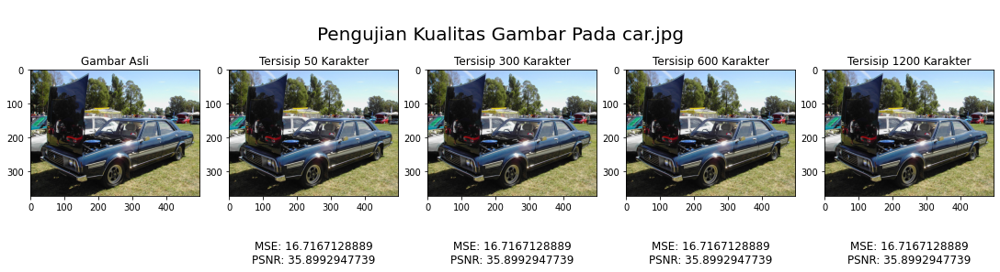

In [92]:
filename = original_f[16].lstrip("original/")
metrics_50 = calculate_metrics(original_f[16], mod50_f[16])
metrics_300 = calculate_metrics(original_f[16], mod300_f[16])
metrics_600 = calculate_metrics(original_f[16], mod600_f[16])
metrics_1200 = calculate_metrics(original_f[16], mod1200_f[16])
show_images(image_path=[original_f[16], mod50_f[16], mod300_f[16], mod600_f[16], mod1200_f[16]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

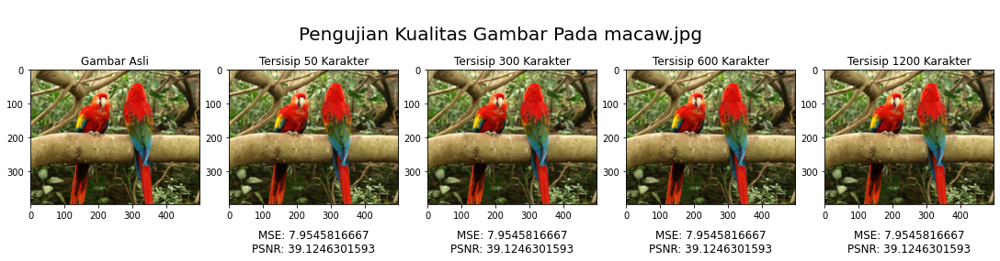

In [93]:
filename = original_f[17].lstrip("original/")
metrics_50 = calculate_metrics(original_f[17], mod50_f[17])
metrics_300 = calculate_metrics(original_f[17], mod300_f[17])
metrics_600 = calculate_metrics(original_f[17], mod600_f[17])
metrics_1200 = calculate_metrics(original_f[17], mod1200_f[17])
show_images(image_path=[original_f[17], mod50_f[17], mod300_f[17], mod600_f[17], mod1200_f[17]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

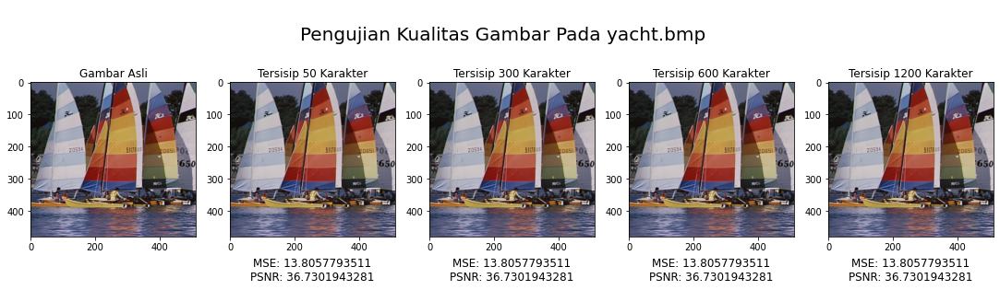

In [94]:
filename = original_f[18].lstrip("original/")
metrics_50 = calculate_metrics(original_f[18], mod50_f[18])
metrics_300 = calculate_metrics(original_f[18], mod300_f[18])
metrics_600 = calculate_metrics(original_f[18], mod600_f[18])
metrics_1200 = calculate_metrics(original_f[18], mod1200_f[18])
show_images(image_path=[original_f[18], mod50_f[18], mod300_f[18], mod600_f[18], mod1200_f[18]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

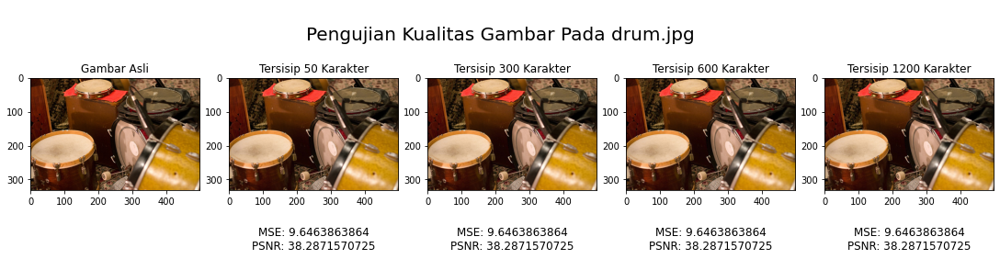

In [95]:
filename = original_f[19].lstrip("original/")
metrics_50 = calculate_metrics(original_f[19], mod50_f[19])
metrics_300 = calculate_metrics(original_f[19], mod300_f[19])
metrics_600 = calculate_metrics(original_f[19], mod600_f[19])
metrics_1200 = calculate_metrics(original_f[19], mod1200_f[19])
show_images(image_path=[original_f[19], mod50_f[19], mod300_f[19], mod600_f[19], mod1200_f[19]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

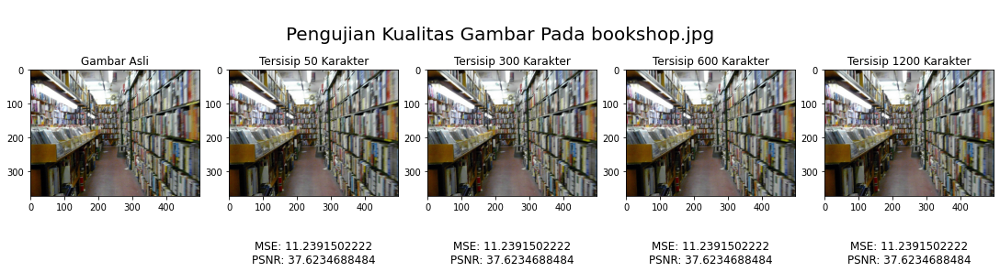

In [96]:
filename = original_f[20].lstrip("original/")
metrics_50 = calculate_metrics(original_f[20], mod50_f[20])
metrics_300 = calculate_metrics(original_f[20], mod300_f[20])
metrics_600 = calculate_metrics(original_f[20], mod600_f[20])
metrics_1200 = calculate_metrics(original_f[20], mod1200_f[20])
show_images(image_path=[original_f[20], mod50_f[20], mod300_f[20], mod600_f[20], mod1200_f[20]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

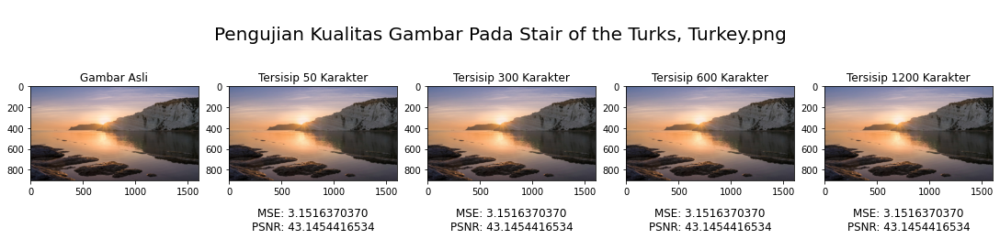

In [97]:
filename = original_f[21].lstrip("original/")
metrics_50 = calculate_metrics(original_f[21], mod50_f[21])
metrics_300 = calculate_metrics(original_f[21], mod300_f[21])
metrics_600 = calculate_metrics(original_f[21], mod600_f[21])
metrics_1200 = calculate_metrics(original_f[21], mod1200_f[21])
show_images(image_path=[original_f[21], mod50_f[21], mod300_f[21], mod600_f[21], mod1200_f[21]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

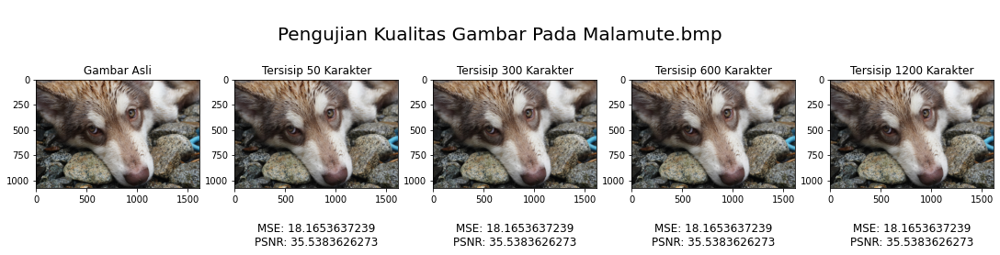

In [98]:
filename = original_f[22].lstrip("original/")
metrics_50 = calculate_metrics(original_f[22], mod50_f[22])
metrics_300 = calculate_metrics(original_f[22], mod300_f[22])
metrics_600 = calculate_metrics(original_f[22], mod600_f[22])
metrics_1200 = calculate_metrics(original_f[22], mod1200_f[22])
show_images(image_path=[original_f[22], mod50_f[22], mod300_f[22], mod600_f[22], mod1200_f[22]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

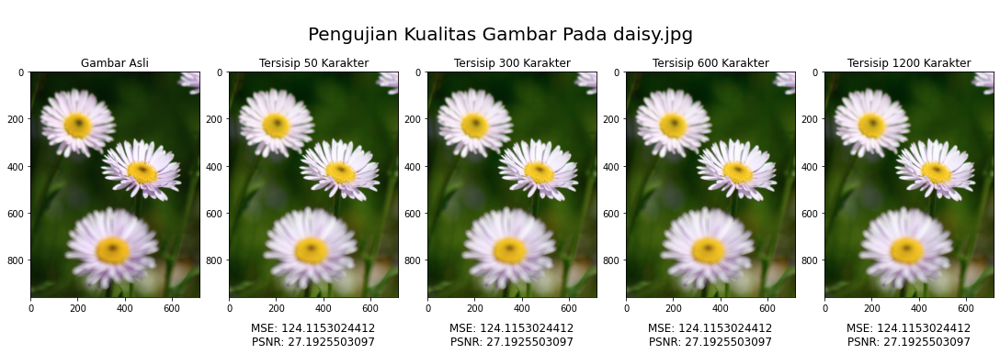

In [99]:
filename = original_f[23].lstrip("original/")
metrics_50 = calculate_metrics(original_f[23], mod50_f[23])
metrics_300 = calculate_metrics(original_f[23], mod300_f[23])
metrics_600 = calculate_metrics(original_f[23], mod600_f[23])
metrics_1200 = calculate_metrics(original_f[23], mod1200_f[23])
show_images(
    image_path=[original_f[23], mod50_f[23], mod300_f[23], mod600_f[23], mod1200_f[23]], 
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], 
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
    title_padding=-0.08,
    stats_padding=0.035
)

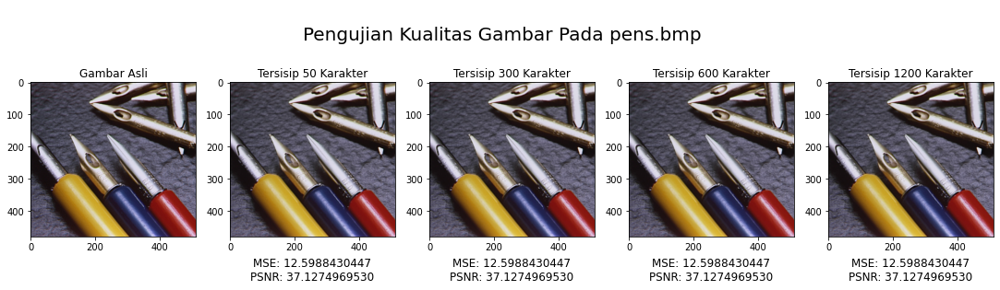

In [100]:
filename = original_f[24].lstrip("original/")
metrics_50 = calculate_metrics(original_f[24], mod50_f[24])
metrics_300 = calculate_metrics(original_f[24], mod300_f[24])
metrics_600 = calculate_metrics(original_f[24], mod600_f[24])
metrics_1200 = calculate_metrics(original_f[24], mod1200_f[24])
show_images(image_path=[original_f[24], mod50_f[24], mod300_f[24], mod600_f[24], mod1200_f[24]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

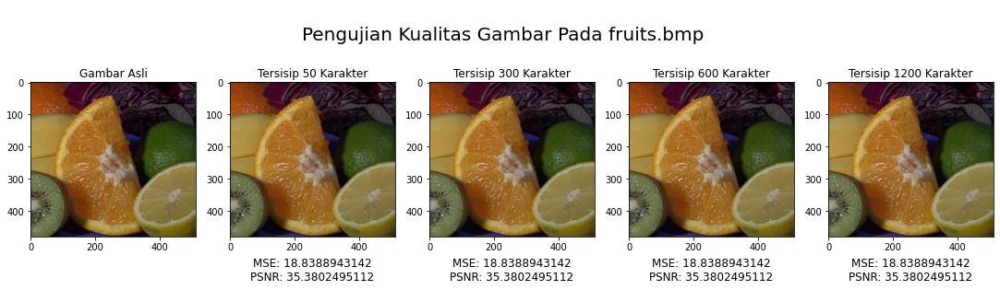

In [101]:
filename = original_f[25].lstrip("original/")
metrics_50 = calculate_metrics(original_f[25], mod50_f[25])
metrics_300 = calculate_metrics(original_f[25], mod300_f[25])
metrics_600 = calculate_metrics(original_f[25], mod600_f[25])
metrics_1200 = calculate_metrics(original_f[25], mod1200_f[25])
show_images(image_path=[original_f[25], mod50_f[25], mod300_f[25], mod600_f[25], mod1200_f[25]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

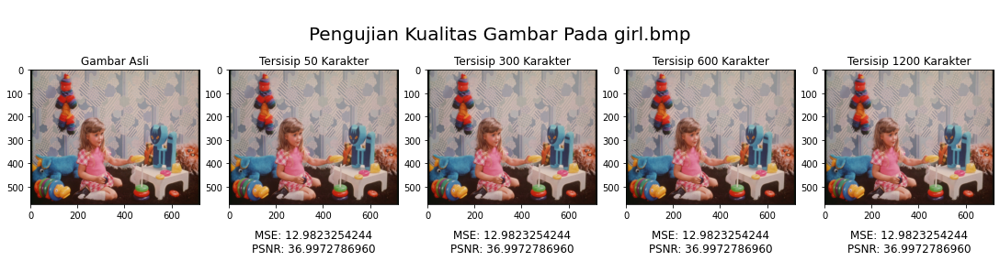

In [102]:
filename = original_f[26][9:]
metrics_50 = calculate_metrics(original_f[26], mod50_f[26])
metrics_300 = calculate_metrics(original_f[26], mod300_f[26])
metrics_600 = calculate_metrics(original_f[26], mod600_f[26])
metrics_1200 = calculate_metrics(original_f[26], mod1200_f[26])
show_images(image_path=[original_f[26], mod50_f[26], mod300_f[26], mod600_f[26], mod1200_f[26]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

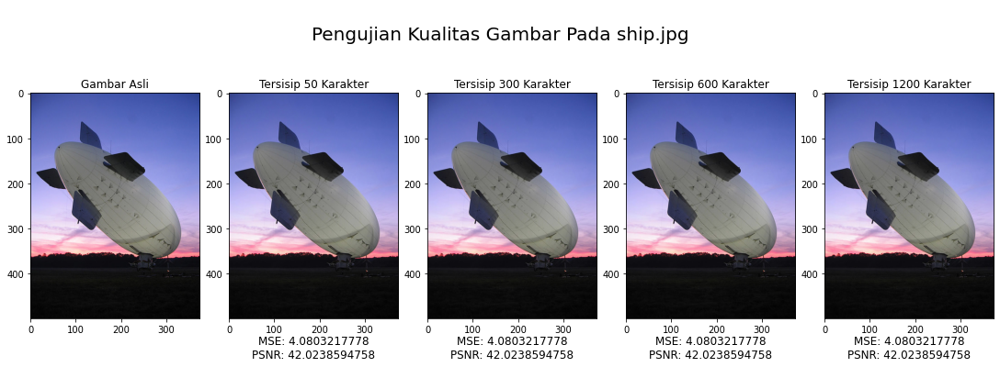

In [103]:
filename = original_f[27].lstrip("original/")
metrics_50 = calculate_metrics(original_f[27], mod50_f[27])
metrics_300 = calculate_metrics(original_f[27], mod300_f[27])
metrics_600 = calculate_metrics(original_f[27], mod600_f[27])
metrics_1200 = calculate_metrics(original_f[27], mod1200_f[27])
show_images(image_path=[original_f[27], mod50_f[27], mod300_f[27], mod600_f[27], mod1200_f[27]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

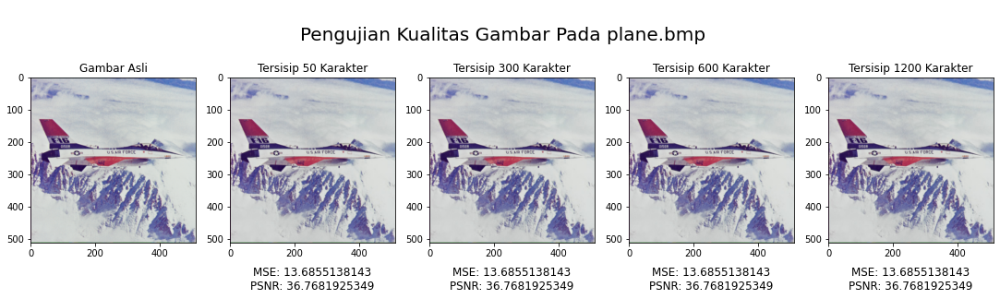

In [104]:
filename = original_f[28].lstrip("original/")
metrics_50 = calculate_metrics(original_f[28], mod50_f[28])
metrics_300 = calculate_metrics(original_f[28], mod300_f[28])
metrics_600 = calculate_metrics(original_f[28], mod600_f[28])
metrics_1200 = calculate_metrics(original_f[28], mod1200_f[28])
show_images(image_path=[original_f[28], mod50_f[28], mod300_f[28], mod600_f[28], mod1200_f[28]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

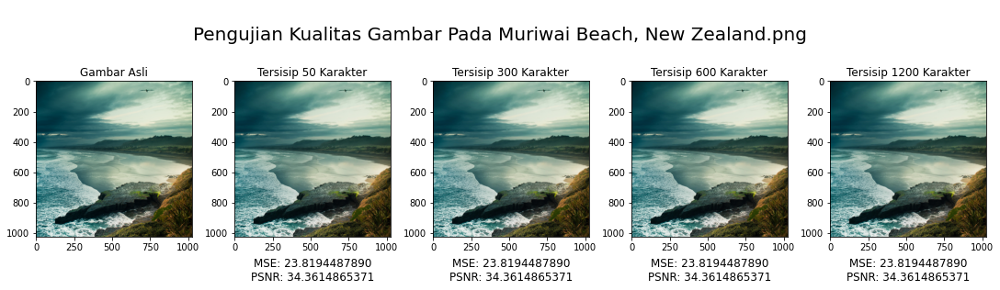

In [105]:
filename = original_f[29].lstrip("original/")
metrics_50 = calculate_metrics(original_f[29], mod50_f[29])
metrics_300 = calculate_metrics(original_f[29], mod300_f[29])
metrics_600 = calculate_metrics(original_f[29], mod600_f[29])
metrics_1200 = calculate_metrics(original_f[29], mod1200_f[29])
show_images(image_path=[original_f[29], mod50_f[29], mod300_f[29], mod600_f[29], mod1200_f[29]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

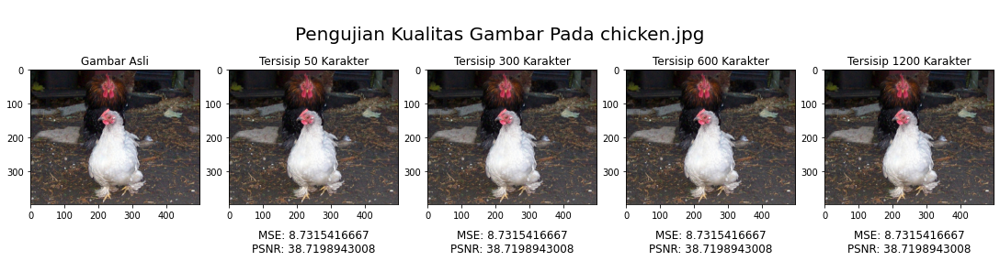

In [106]:
filename = original_f[30].lstrip("original/")
metrics_50 = calculate_metrics(original_f[30], mod50_f[30])
metrics_300 = calculate_metrics(original_f[30], mod300_f[30])
metrics_600 = calculate_metrics(original_f[30], mod600_f[30])
metrics_1200 = calculate_metrics(original_f[30], mod1200_f[30])
show_images(image_path=[original_f[30], mod50_f[30], mod300_f[30], mod600_f[30], mod1200_f[30]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

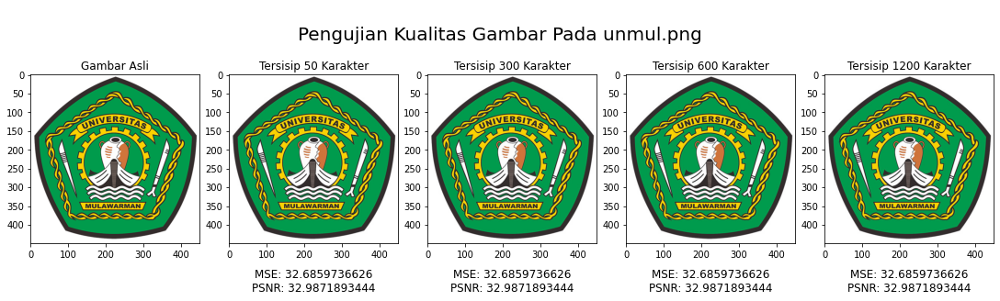

In [107]:
filename = original_f[31].lstrip("original/")
metrics_50 = calculate_metrics(original_f[31], mod50_f[31])
metrics_300 = calculate_metrics(original_f[31], mod300_f[31])
metrics_600 = calculate_metrics(original_f[31], mod600_f[31])
metrics_1200 = calculate_metrics(original_f[31], mod1200_f[31])
show_images(image_path=[original_f[31], mod50_f[31], mod300_f[31], mod600_f[31], mod1200_f[31]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

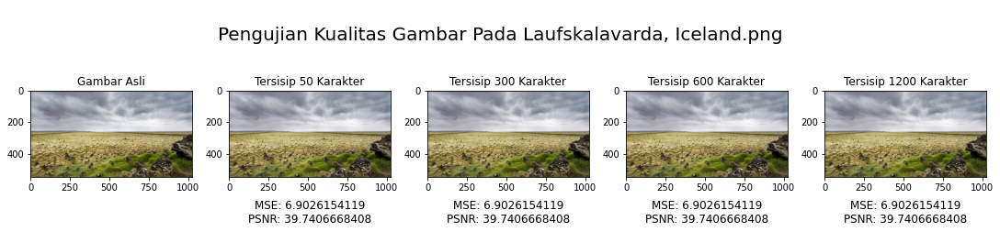

In [108]:
filename = original_f[32].lstrip("original/")
metrics_50 = calculate_metrics(original_f[32], mod50_f[32])
metrics_300 = calculate_metrics(original_f[32], mod300_f[32])
metrics_600 = calculate_metrics(original_f[32], mod600_f[32])
metrics_1200 = calculate_metrics(original_f[32], mod1200_f[32])
show_images(image_path=[original_f[32], mod50_f[32], mod300_f[32], mod600_f[32], mod1200_f[32]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

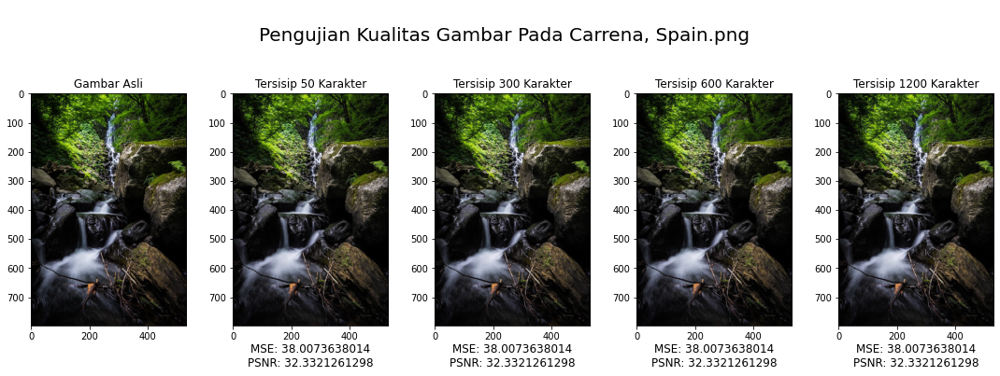

In [109]:
filename = original_f[33].lstrip("original/")
metrics_50 = calculate_metrics(original_f[33], mod50_f[33])
metrics_300 = calculate_metrics(original_f[33], mod300_f[33])
metrics_600 = calculate_metrics(original_f[33], mod600_f[33])
metrics_1200 = calculate_metrics(original_f[33], mod1200_f[33])
show_images(image_path=[original_f[33], mod50_f[33], mod300_f[33], mod600_f[33], mod1200_f[33]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

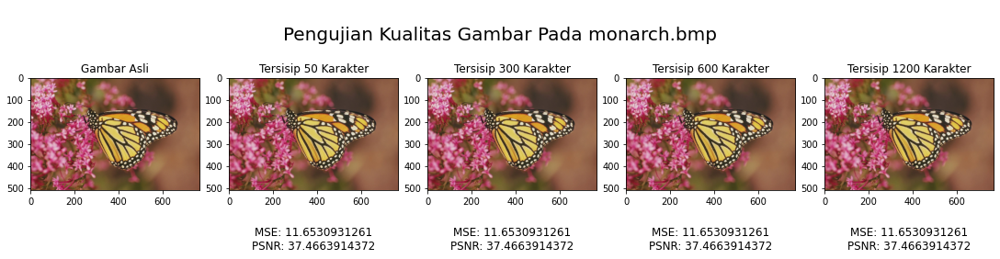

In [110]:
filename = original_f[34].lstrip("original/")
metrics_50 = calculate_metrics(original_f[34], mod50_f[34])
metrics_300 = calculate_metrics(original_f[34], mod300_f[34])
metrics_600 = calculate_metrics(original_f[34], mod600_f[34])
metrics_1200 = calculate_metrics(original_f[34], mod1200_f[34])
show_images(image_path=[original_f[34], mod50_f[34], mod300_f[34], mod600_f[34], mod1200_f[34]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

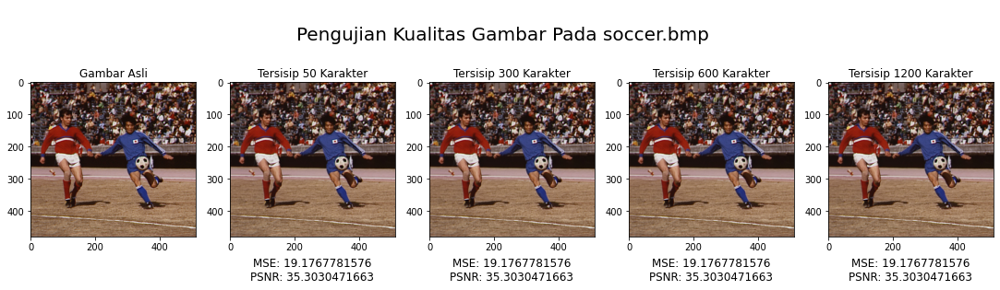

In [111]:
filename = original_f[35].lstrip("original/")
metrics_50 = calculate_metrics(original_f[35], mod50_f[35])
metrics_300 = calculate_metrics(original_f[35], mod300_f[35])
metrics_600 = calculate_metrics(original_f[35], mod600_f[35])
metrics_1200 = calculate_metrics(original_f[35], mod1200_f[35])
show_images(image_path=[original_f[35], mod50_f[35], mod300_f[35], mod600_f[35], mod1200_f[35]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

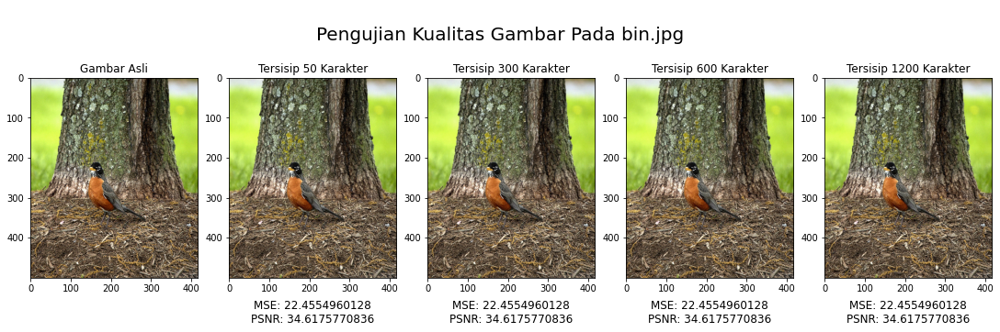

In [112]:
filename = original_f[36].lstrip("original/")
metrics_50 = calculate_metrics(original_f[36], mod50_f[36])
metrics_300 = calculate_metrics(original_f[36], mod300_f[36])
metrics_600 = calculate_metrics(original_f[36], mod600_f[36])
metrics_1200 = calculate_metrics(original_f[36], mod1200_f[36])
show_images(
    image_path=[original_f[36], mod50_f[36], mod300_f[36], mod600_f[36], mod1200_f[36]], 
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], 
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
    title_padding=-0.11,
    stats_padding=0.05
)

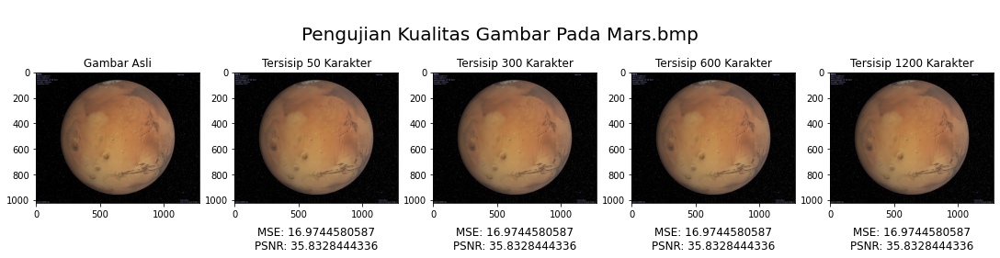

In [113]:
filename = original_f[37].lstrip("original/")
metrics_50 = calculate_metrics(original_f[37], mod50_f[37])
metrics_300 = calculate_metrics(original_f[37], mod300_f[37])
metrics_600 = calculate_metrics(original_f[37], mod600_f[37])
metrics_1200 = calculate_metrics(original_f[37], mod1200_f[37])
show_images(image_path=[original_f[37], mod50_f[37], mod300_f[37], mod600_f[37], mod1200_f[37]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

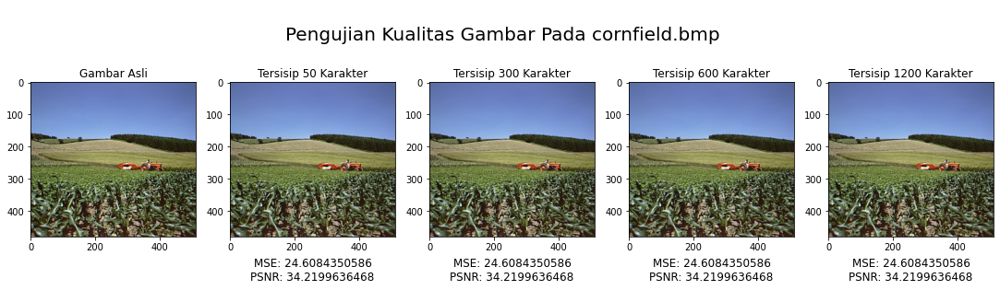

In [114]:
filename = original_f[38].lstrip("original/")
metrics_50 = calculate_metrics(original_f[38], mod50_f[38])
metrics_300 = calculate_metrics(original_f[38], mod300_f[38])
metrics_600 = calculate_metrics(original_f[38], mod600_f[38])
metrics_1200 = calculate_metrics(original_f[38], mod1200_f[38])
show_images(image_path=[original_f[38], mod50_f[38], mod300_f[38], mod600_f[38], mod1200_f[38]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

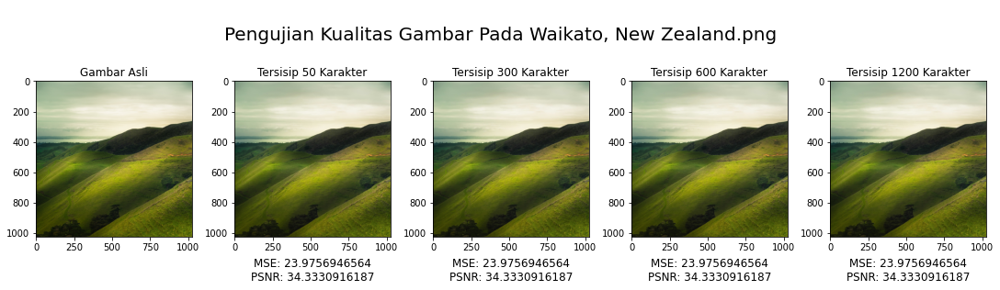

In [115]:
filename = original_f[39].lstrip("original/")
metrics_50 = calculate_metrics(original_f[39], mod50_f[39])
metrics_300 = calculate_metrics(original_f[39], mod300_f[39])
metrics_600 = calculate_metrics(original_f[39], mod600_f[39])
metrics_1200 = calculate_metrics(original_f[39], mod1200_f[39])
show_images(image_path=[original_f[39], mod50_f[39], mod300_f[39], mod600_f[39], mod1200_f[39]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

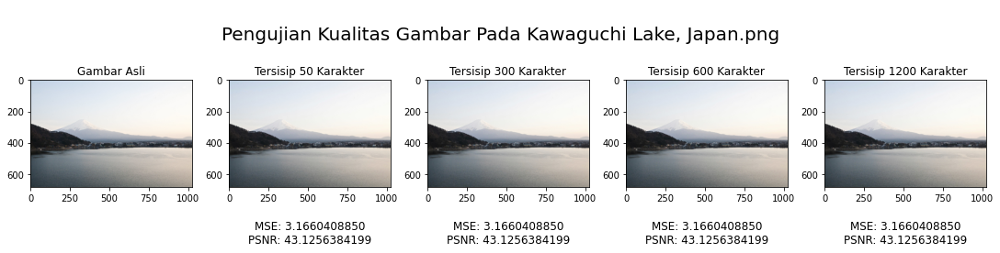

In [116]:
filename = original_f[40].lstrip("original/")
metrics_50 = calculate_metrics(original_f[40], mod50_f[40])
metrics_300 = calculate_metrics(original_f[40], mod300_f[40])
metrics_600 = calculate_metrics(original_f[40], mod600_f[40])
metrics_1200 = calculate_metrics(original_f[40], mod1200_f[40])
show_images(image_path=[original_f[40], mod50_f[40], mod300_f[40], mod600_f[40], mod1200_f[40]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

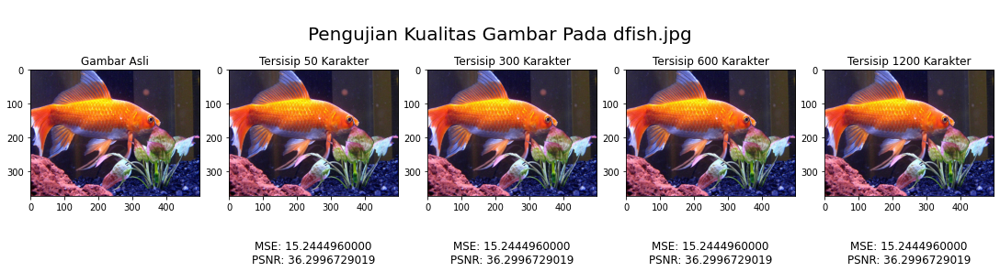

In [117]:
filename = original_f[41].lstrip("original/")
metrics_50 = calculate_metrics(original_f[41], mod50_f[41])
metrics_300 = calculate_metrics(original_f[41], mod300_f[41])
metrics_600 = calculate_metrics(original_f[41], mod600_f[41])
metrics_1200 = calculate_metrics(original_f[41], mod1200_f[41])
show_images(image_path=[original_f[41], mod50_f[41], mod300_f[41], mod600_f[41], mod1200_f[41]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

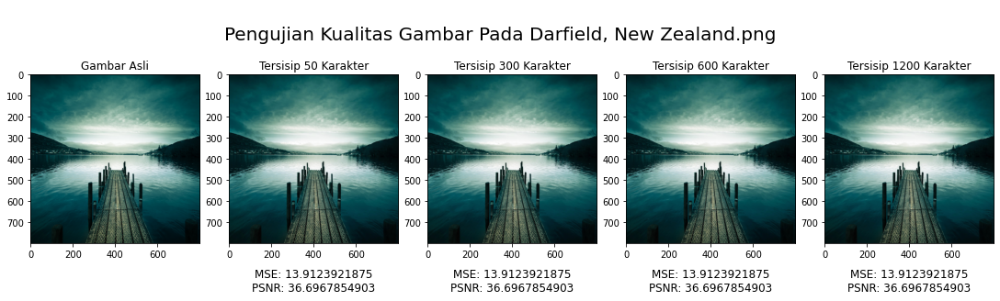

In [118]:
filename = original_f[42].lstrip("original/")
metrics_50 = calculate_metrics(original_f[42], mod50_f[42])
metrics_300 = calculate_metrics(original_f[42], mod300_f[42])
metrics_600 = calculate_metrics(original_f[42], mod600_f[42])
metrics_1200 = calculate_metrics(original_f[42], mod1200_f[42])
show_images(image_path=[original_f[42], mod50_f[42], mod300_f[42], mod600_f[42], mod1200_f[42]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

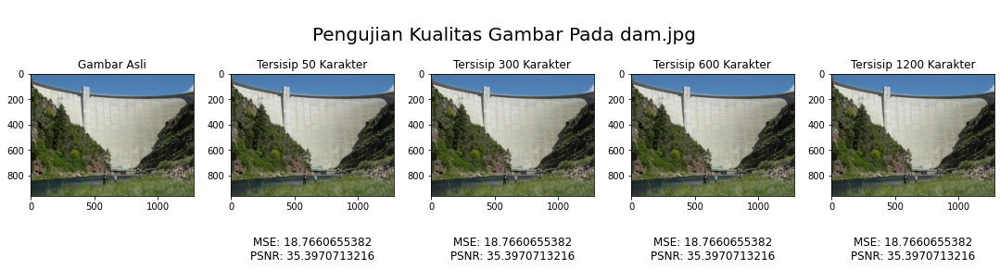

In [119]:
filename = original_f[43].lstrip("original/")
metrics_50 = calculate_metrics(original_f[43], mod50_f[43])
metrics_300 = calculate_metrics(original_f[43], mod300_f[43])
metrics_600 = calculate_metrics(original_f[43], mod600_f[43])
metrics_1200 = calculate_metrics(original_f[43], mod1200_f[43])
show_images(image_path=[original_f[43], mod50_f[43], mod300_f[43], mod600_f[43], mod1200_f[43]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

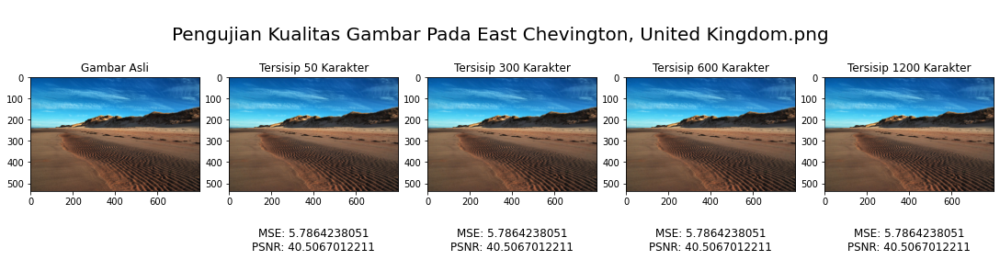

In [120]:
filename = original_f[44].lstrip("original/")
metrics_50 = calculate_metrics(original_f[44], mod50_f[44])
metrics_300 = calculate_metrics(original_f[44], mod300_f[44])
metrics_600 = calculate_metrics(original_f[44], mod600_f[44])
metrics_1200 = calculate_metrics(original_f[44], mod1200_f[44])
show_images(image_path=[original_f[44], mod50_f[44], mod300_f[44], mod600_f[44], mod1200_f[44]], title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter", f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200], plot_title=f"Pengujian Kualitas Gambar Pada {filename}")